# Approach 1: Roads and intersections only, as one class

In [21]:
IMG_HEIGHT = 512
IMG_WIDTH = 512
IMG_CHANNELS = 3

In [22]:
import tensorflow as tf
num_classes = 1 # 0 as background and 1 as road

inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
b1 = tf.keras.layers.BatchNormalization()(c1)
r1 = tf.keras.layers.ReLU()(b1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(r1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
b2 = tf.keras.layers.BatchNormalization()(c2)
r2 = tf.keras.layers.ReLU()(b2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(r2)

c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
b3 = tf.keras.layers.BatchNormalization()(c3)
r3 = tf.keras.layers.ReLU()(b3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(r3)

c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
b4 = tf.keras.layers.BatchNormalization()(c4)
r4 = tf.keras.layers.ReLU()(b4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(r4)

c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
b5 = tf.keras.layers.BatchNormalization()(c5)
r5 = tf.keras.layers.ReLU()(b5)
c5 = tf.keras.layers.Dropout(0.3)(r5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
u6 = tf.keras.layers.BatchNormalization()(u6)
u6 = tf.keras.layers.ReLU()(u6)


u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(u6)
u7 = tf.keras.layers.concatenate([u7, c3])
u7 = tf.keras.layers.BatchNormalization()(u7)
u7 = tf.keras.layers.ReLU()(u7)


u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(u7)
u8 = tf.keras.layers.concatenate([u8, c2])
u8 = tf.keras.layers.BatchNormalization()(u8)
u8 = tf.keras.layers.ReLU()(u8)

u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(u8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
u9 = tf.keras.layers.BatchNormalization()(u9)
u9 = tf.keras.layers.ReLU()(u9)

outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='sigmoid')(u9)

In [23]:
from my_metrics import iou_loss, dice_dice_loss
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss=iou_loss, metrics=['accuracy',
                                                                     tf.keras.metrics.binary_crossentropy,
                                                                     tf.keras.metrics.BinaryIoU(),
                                                                     tf.keras.metrics.Precision(),
                                                                     tf.keras.metrics.Recall(),
                                                                     tf.keras.metrics.FalseNegatives(),
                                                                     tf.keras.metrics.FalsePositives(),
                                                                     tf.keras.metrics.TruePositives(),
                                                                     tf.keras.metrics.TruePositives()
                                                                     ])

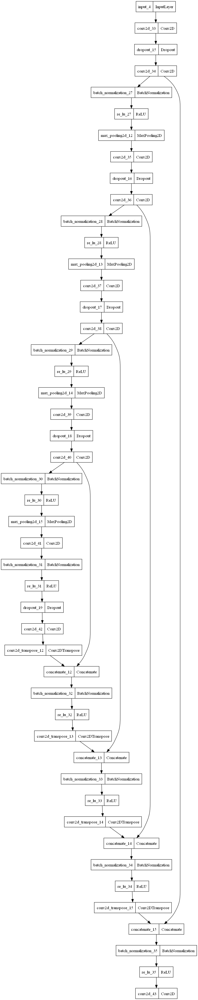

In [24]:
tf.keras.utils.plot_model(model, "model.png")

In [25]:
%load_ext autoreload
%autoreload 2
import tensorflow as tf
import rasterio
import numpy as np
import os
import matplotlib.pyplot as plt
import random
from helpers import show_image_from_np


seed = 42
tf.random.set_seed(seed)
epochs = 10


def read_files():
    def _gen():
        tile_directory = '../data/tiles'
        photos_dir = os.path.join(tile_directory, 'photos')
        masks_dir = os.path.join(tile_directory, 'masks')

        photo_files = os.listdir(photos_dir)
        mask_files = os.listdir(masks_dir)
        # number of samples as fraction of the whole dataset
        num_samples = int(len(photo_files) * 0.05)

        photo_files_subset = photo_files[:num_samples]
        mask_files_subset = mask_files[:num_samples]

        for photo_path, mask_path in zip(photo_files_subset, mask_files_subset):
            with rasterio.open(os.path.join(photos_dir, photo_path)) as photo_ds:
                photo = np.transpose(photo_ds.read([1, 2, 3]), (1, 2, 0))

            with rasterio.open(os.path.join(masks_dir, mask_path)) as mask_ds:
                mask = mask_ds.read(1)
                mask = mask.astype('int32')

            yield photo, mask
    return _gen


def preprocess_image(photo, mask):
    photo = tf.image.resize(photo, [512, 512])

    mask = tf.expand_dims(mask, axis=-1)
    mask = tf.image.resize(mask, [512, 512])
    mask = tf.cast(mask, tf.int32)
    mask = tf.where(mask==5, 4, mask)  # Set Intersection to Road
    mask = tf.where(mask==4, 4, 0)  # Set Anything other than Road to 0
    mask = tf.where(mask==4, 1, mask)  # Finally set Road to 1 (binary segmentation as of now)

    return photo, mask

def skip_condition(photo, mask):
    # Skip samples that are have labels greater than 10 or no labels at all
    max_value = tf.reduce_max(mask)
    less = tf.less(max_value, 11)
    greater = tf.greater(max_value, 0)
    return tf.logical_and(less, greater)

def normalize_input(photo, mask):
    photo = tf.cast(photo, tf.float32)
    photo = photo/255.
    return photo, mask


output_signature = (
    tf.TensorSpec(shape=(2048, 2048, 3), dtype=tf.int32),
    tf.TensorSpec(shape=(2048, 2048), dtype=tf.int32)
)

dataset = tf.data.Dataset.from_generator(read_files(), output_signature=output_signature)
dataset = dataset.shuffle(buffer_size=10)
dataset = dataset.map(preprocess_image)
dataset = dataset.filter(skip_condition)
# for x, y in dataset:
#     print(np.unique(y))
#     show_image_from_np(x.numpy(), y.numpy())
dataset = dataset.map(normalize_input)


# batch_size = 4
# prefetch_size = tf.data.experimental.AUTOTUNE
# dataset = dataset.shuffle(buffer_size=10)

train_dataset, test_dataset = tf.keras.utils.split_dataset(dataset, left_size=0.8)

train_dataset = train_dataset.batch(4)
# train_dataset = train_dataset.prefetch(prefetch_size)
train_dataset = train_dataset.repeat(epochs)

test_dataset = test_dataset.batch(1)
# test_dataset = test_dataset.prefetch(prefetch_size)
# test_dataset = test_dataset.repeat(epochs)

hist = model.fit(train_dataset, epochs=epochs)
# # Create an iterator from the dataset
# iterator = tf.compat.v1.data.make_one_shot_iterator(dataset)
#
# # Get the next batch of data
# next_batch = iterator.get_next()
#
# # Now, you can use the `next_batch` in your training loop to feed the U-Net model
# # Iterate over the batches and train your model
# while True:
#     try:
#         photo_batch, mask_batch = tf.compat.v1.get_default_session().run(next_batch)
#         # feed data
#     except tf.errors.OutOfRangeError:
#         break

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Epoch 1/10


ValueError: in user code:

    File "E:\agh\CI\tfgpu\lib\site-packages\keras\engine\training.py", line 1160, in train_function  *
        return step_function(self, iterator)
    File "E:\agh\CI\tfgpu\lib\site-packages\keras\engine\training.py", line 1146, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "E:\agh\CI\tfgpu\lib\site-packages\keras\engine\training.py", line 1135, in run_step  **
        outputs = model.train_step(data)
    File "E:\agh\CI\tfgpu\lib\site-packages\keras\engine\training.py", line 997, in train_step
        self.optimizer.minimize(loss, self.trainable_variables, tape=tape)
    File "E:\agh\CI\tfgpu\lib\site-packages\keras\optimizers\optimizer_v2\optimizer_v2.py", line 579, in minimize
        return self.apply_gradients(grads_and_vars, name=name)
    File "E:\agh\CI\tfgpu\lib\site-packages\keras\optimizers\optimizer_v2\optimizer_v2.py", line 689, in apply_gradients
        grads_and_vars = optimizer_utils.filter_empty_gradients(grads_and_vars)
    File "E:\agh\CI\tfgpu\lib\site-packages\keras\optimizers\optimizer_v2\utils.py", line 77, in filter_empty_gradients
        raise ValueError(

    ValueError: No gradients provided for any variable: (['conv2d_33/kernel:0', 'conv2d_33/bias:0', 'conv2d_34/kernel:0', 'conv2d_34/bias:0', 'batch_normalization_27/gamma:0', 'batch_normalization_27/beta:0', 'conv2d_35/kernel:0', 'conv2d_35/bias:0', 'conv2d_36/kernel:0', 'conv2d_36/bias:0', 'batch_normalization_28/gamma:0', 'batch_normalization_28/beta:0', 'conv2d_37/kernel:0', 'conv2d_37/bias:0', 'conv2d_38/kernel:0', 'conv2d_38/bias:0', 'batch_normalization_29/gamma:0', 'batch_normalization_29/beta:0', 'conv2d_39/kernel:0', 'conv2d_39/bias:0', 'conv2d_40/kernel:0', 'conv2d_40/bias:0', 'batch_normalization_30/gamma:0', 'batch_normalization_30/beta:0', 'conv2d_41/kernel:0', 'conv2d_41/bias:0', 'batch_normalization_31/gamma:0', 'batch_normalization_31/beta:0', 'conv2d_42/kernel:0', 'conv2d_42/bias:0', 'conv2d_transpose_12/kernel:0', 'conv2d_transpose_12/bias:0', 'batch_normalization_32/gamma:0', 'batch_normalization_32/beta:0', 'conv2d_transpose_13/kernel:0', 'conv2d_transpose_13/bias:0', 'batch_normalization_33/gamma:0', 'batch_normalization_33/beta:0', 'conv2d_transpose_14/kernel:0', 'conv2d_transpose_14/bias:0', 'batch_normalization_34/gamma:0', 'batch_normalization_34/beta:0', 'conv2d_transpose_15/kernel:0', 'conv2d_transpose_15/bias:0', 'batch_normalization_35/gamma:0', 'batch_normalization_35/beta:0', 'conv2d_43/kernel:0', 'conv2d_43/bias:0'],). Provided `grads_and_vars` is ((None, <tf.Variable 'conv2d_33/kernel:0' shape=(3, 3, 3, 16) dtype=float32>), (None, <tf.Variable 'conv2d_33/bias:0' shape=(16,) dtype=float32>), (None, <tf.Variable 'conv2d_34/kernel:0' shape=(3, 3, 16, 16) dtype=float32>), (None, <tf.Variable 'conv2d_34/bias:0' shape=(16,) dtype=float32>), (None, <tf.Variable 'batch_normalization_27/gamma:0' shape=(16,) dtype=float32>), (None, <tf.Variable 'batch_normalization_27/beta:0' shape=(16,) dtype=float32>), (None, <tf.Variable 'conv2d_35/kernel:0' shape=(3, 3, 16, 32) dtype=float32>), (None, <tf.Variable 'conv2d_35/bias:0' shape=(32,) dtype=float32>), (None, <tf.Variable 'conv2d_36/kernel:0' shape=(3, 3, 32, 32) dtype=float32>), (None, <tf.Variable 'conv2d_36/bias:0' shape=(32,) dtype=float32>), (None, <tf.Variable 'batch_normalization_28/gamma:0' shape=(32,) dtype=float32>), (None, <tf.Variable 'batch_normalization_28/beta:0' shape=(32,) dtype=float32>), (None, <tf.Variable 'conv2d_37/kernel:0' shape=(3, 3, 32, 64) dtype=float32>), (None, <tf.Variable 'conv2d_37/bias:0' shape=(64,) dtype=float32>), (None, <tf.Variable 'conv2d_38/kernel:0' shape=(3, 3, 64, 64) dtype=float32>), (None, <tf.Variable 'conv2d_38/bias:0' shape=(64,) dtype=float32>), (None, <tf.Variable 'batch_normalization_29/gamma:0' shape=(64,) dtype=float32>), (None, <tf.Variable 'batch_normalization_29/beta:0' shape=(64,) dtype=float32>), (None, <tf.Variable 'conv2d_39/kernel:0' shape=(3, 3, 64, 128) dtype=float32>), (None, <tf.Variable 'conv2d_39/bias:0' shape=(128,) dtype=float32>), (None, <tf.Variable 'conv2d_40/kernel:0' shape=(3, 3, 128, 128) dtype=float32>), (None, <tf.Variable 'conv2d_40/bias:0' shape=(128,) dtype=float32>), (None, <tf.Variable 'batch_normalization_30/gamma:0' shape=(128,) dtype=float32>), (None, <tf.Variable 'batch_normalization_30/beta:0' shape=(128,) dtype=float32>), (None, <tf.Variable 'conv2d_41/kernel:0' shape=(3, 3, 128, 256) dtype=float32>), (None, <tf.Variable 'conv2d_41/bias:0' shape=(256,) dtype=float32>), (None, <tf.Variable 'batch_normalization_31/gamma:0' shape=(256,) dtype=float32>), (None, <tf.Variable 'batch_normalization_31/beta:0' shape=(256,) dtype=float32>), (None, <tf.Variable 'conv2d_42/kernel:0' shape=(3, 3, 256, 256) dtype=float32>), (None, <tf.Variable 'conv2d_42/bias:0' shape=(256,) dtype=float32>), (None, <tf.Variable 'conv2d_transpose_12/kernel:0' shape=(2, 2, 128, 256) dtype=float32>), (None, <tf.Variable 'conv2d_transpose_12/bias:0' shape=(128,) dtype=float32>), (None, <tf.Variable 'batch_normalization_32/gamma:0' shape=(256,) dtype=float32>), (None, <tf.Variable 'batch_normalization_32/beta:0' shape=(256,) dtype=float32>), (None, <tf.Variable 'conv2d_transpose_13/kernel:0' shape=(2, 2, 64, 256) dtype=float32>), (None, <tf.Variable 'conv2d_transpose_13/bias:0' shape=(64,) dtype=float32>), (None, <tf.Variable 'batch_normalization_33/gamma:0' shape=(128,) dtype=float32>), (None, <tf.Variable 'batch_normalization_33/beta:0' shape=(128,) dtype=float32>), (None, <tf.Variable 'conv2d_transpose_14/kernel:0' shape=(2, 2, 32, 128) dtype=float32>), (None, <tf.Variable 'conv2d_transpose_14/bias:0' shape=(32,) dtype=float32>), (None, <tf.Variable 'batch_normalization_34/gamma:0' shape=(64,) dtype=float32>), (None, <tf.Variable 'batch_normalization_34/beta:0' shape=(64,) dtype=float32>), (None, <tf.Variable 'conv2d_transpose_15/kernel:0' shape=(2, 2, 16, 64) dtype=float32>), (None, <tf.Variable 'conv2d_transpose_15/bias:0' shape=(16,) dtype=float32>), (None, <tf.Variable 'batch_normalization_35/gamma:0' shape=(32,) dtype=float32>), (None, <tf.Variable 'batch_normalization_35/beta:0' shape=(32,) dtype=float32>), (None, <tf.Variable 'conv2d_43/kernel:0' shape=(1, 1, 32, 1) dtype=float32>), (None, <tf.Variable 'conv2d_43/bias:0' shape=(1,) dtype=float32>)).


In [19]:
model.save('./models/dice.h5')

In [ ]:
hist.history

In [19]:
preds = model.predict(test_dataset)

57/57 [==============================] - 1s 16ms/step


In [20]:
preds.shape

(57, 512, 512, 1)

In [21]:
preds[0].shape

(512, 512, 1)

In [22]:
np.amax(preds)

1.0

In [23]:
newmasks = np.where(preds>0.5, 4, 0)

In [24]:
newmasks.shape

(57, 512, 512, 1)

In [25]:
np.unique(newmasks)

array([0, 4])

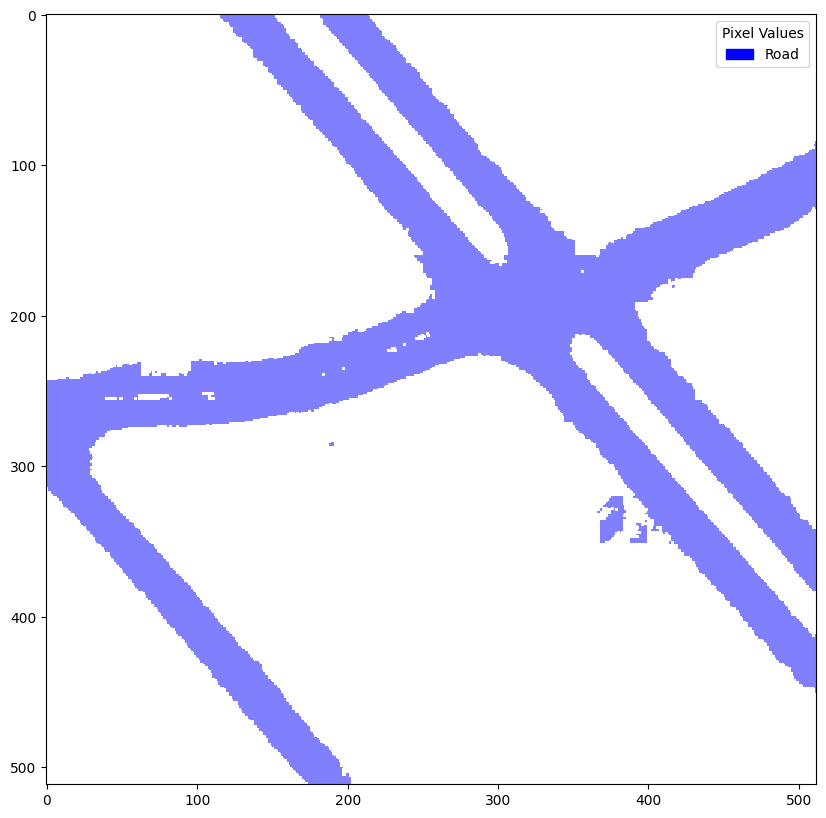

In [26]:
show_image_from_np(mask=newmasks[0])

In [27]:
testdata = test_dataset.take(10)
# traindata = train_dataset.take(5)
# preds2 = model.predict(traindata)
# newmasks2 = np.where(preds2>0.4, 1, 0)

In [28]:
unbatched = [(x.numpy()*255,y.numpy()) for x,y in testdata.unbatch()]

In [29]:
len(unbatched)

10

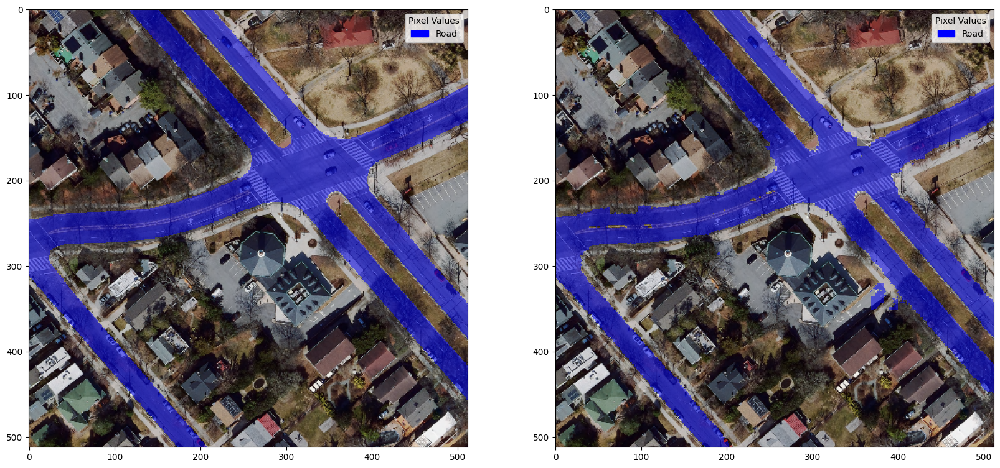

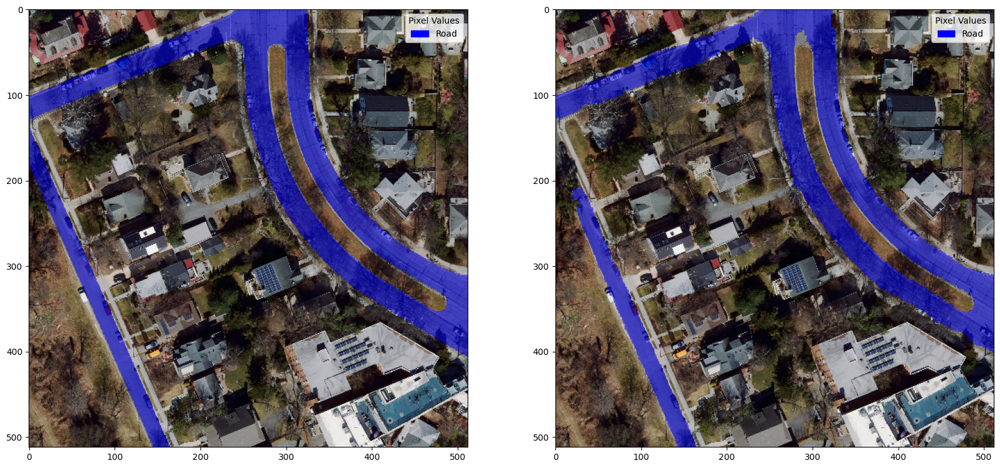

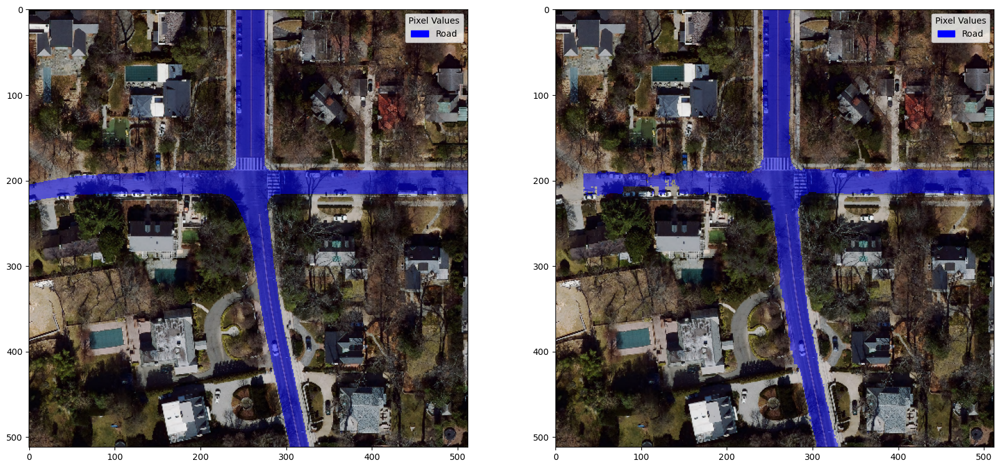

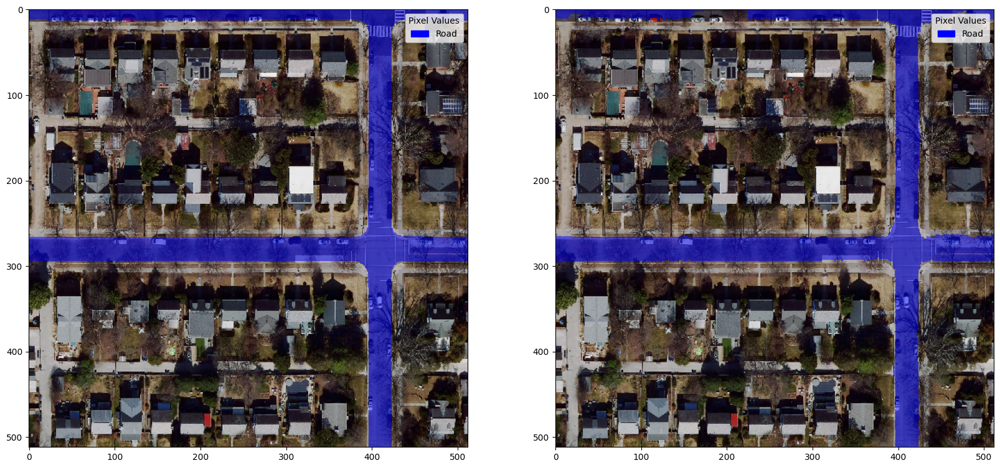

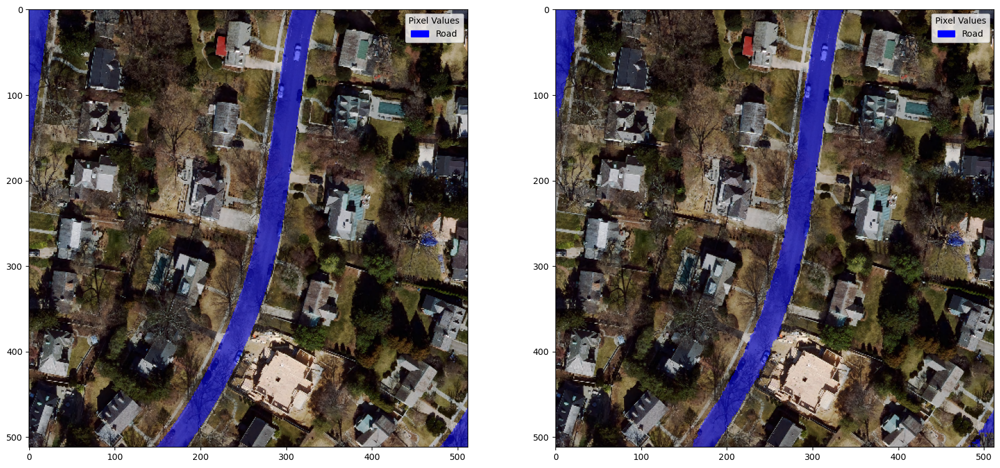

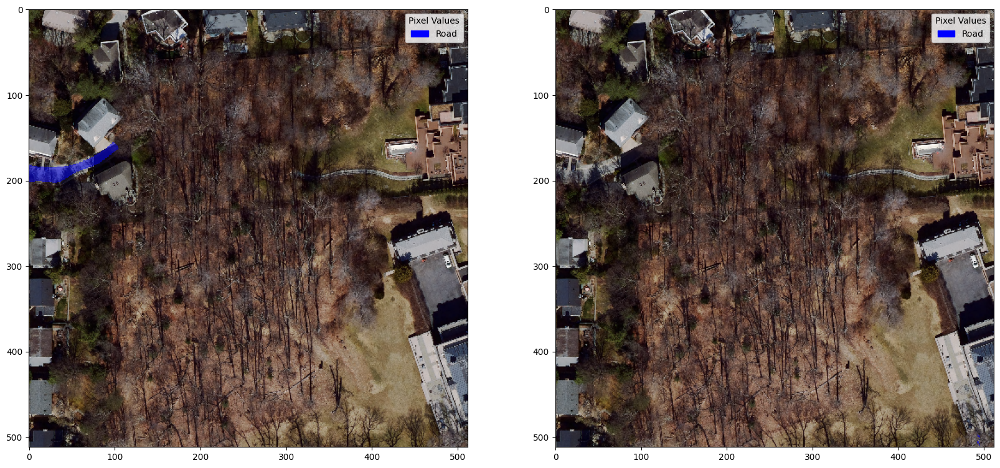

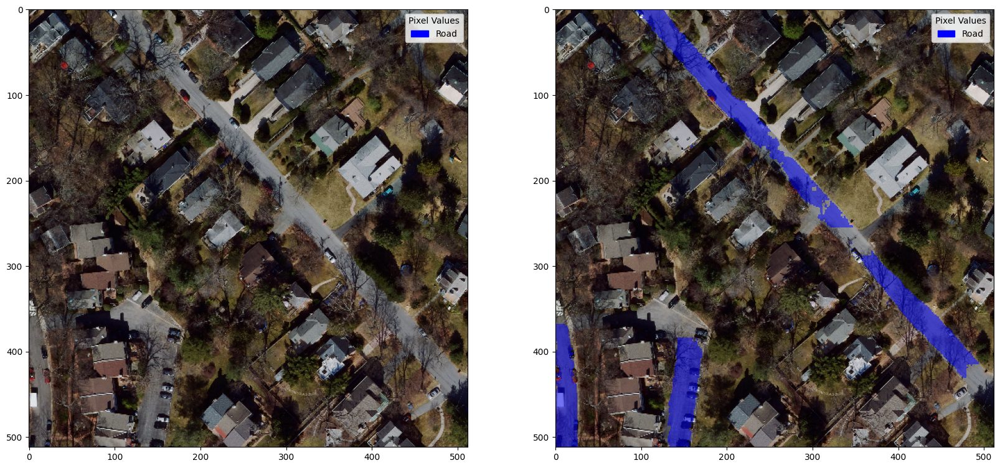

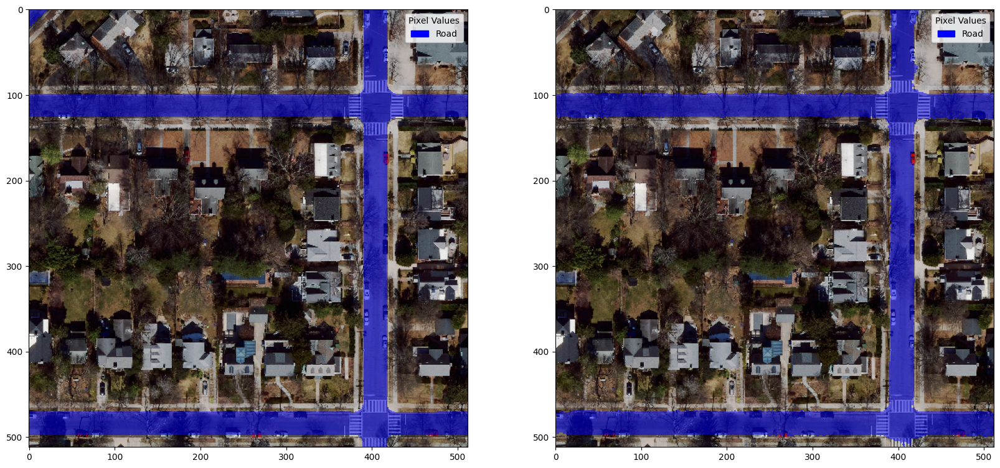

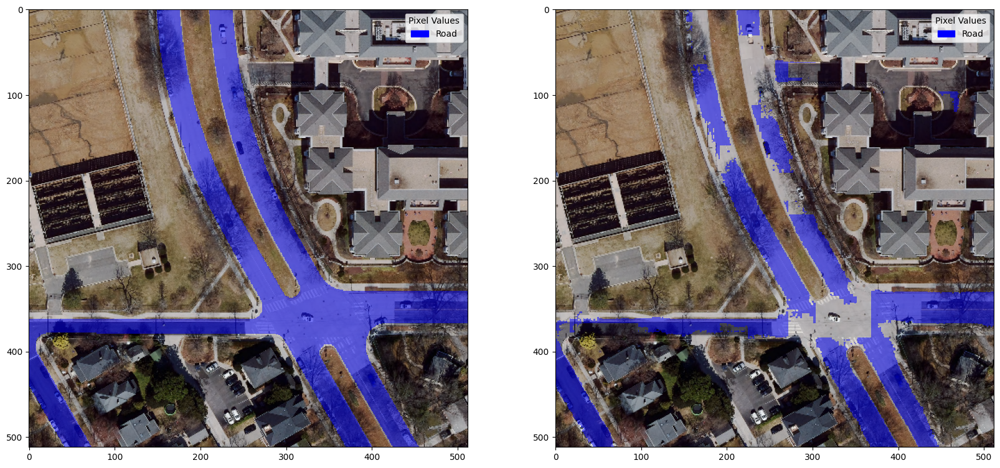

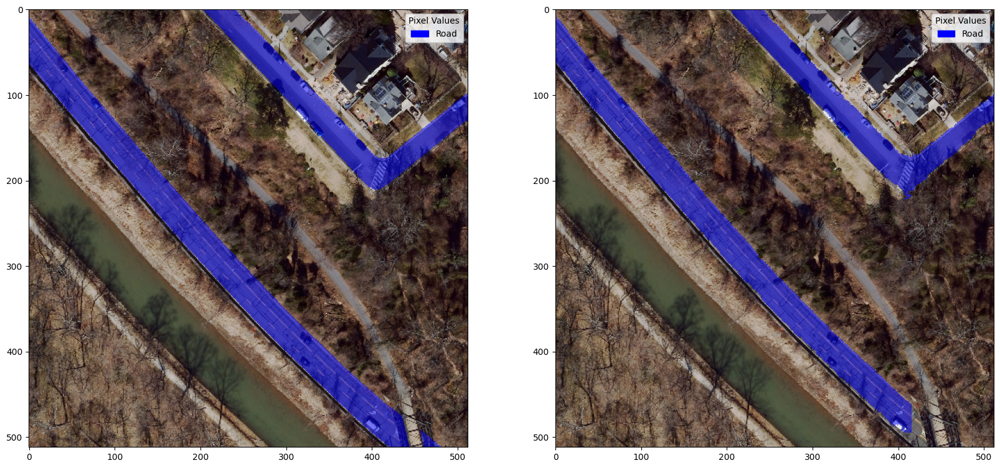

In [31]:
from helpers import compare_predicted_mask
for (photo, mask), pred in zip(unbatched[:10], newmasks):
    # show_image_from_np(photo, pred)
    compare_predicted_mask(photo, np.where(mask==1, 4, mask), pred)